## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt


def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

def calibrate_camera(orgin_image):
    img_size = (orgin_image.shape[1], orgin_image.shape[0])
    return cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)

def undistort_image(image):    
    ret, mtx, dist, rvecs, tvecs = calibrate_camera(image)
    return cv2.undistort(image, mtx, dist, None, mtx), mtx, dist

In [2]:
# Save each test image after applying a correction
for fname in images:
    img = cv2.imread(fname)
    img = cal_undistort(img, objpoints, imgpoints)
    
    savepath  = "." + fname.split(".")[1].split('\\')[0]+'\\corr\\' + fname.split(".")[1].split('\\')[1] + ".jpg"
    print(savepath)
    
    cv2.imwrite(savepath, img)
    cv2.imshow('img',img)
    cv2.waitKey(500)
    
cv2.destroyAllWindows()


./camera_cal\corr\calibration1.jpg
./camera_cal\corr\calibration10.jpg
./camera_cal\corr\calibration11.jpg
./camera_cal\corr\calibration12.jpg
./camera_cal\corr\calibration13.jpg
./camera_cal\corr\calibration14.jpg
./camera_cal\corr\calibration15.jpg
./camera_cal\corr\calibration16.jpg
./camera_cal\corr\calibration17.jpg
./camera_cal\corr\calibration18.jpg
./camera_cal\corr\calibration19.jpg
./camera_cal\corr\calibration2.jpg
./camera_cal\corr\calibration20.jpg
./camera_cal\corr\calibration3.jpg
./camera_cal\corr\calibration4.jpg
./camera_cal\corr\calibration5.jpg
./camera_cal\corr\calibration6.jpg
./camera_cal\corr\calibration7.jpg
./camera_cal\corr\calibration8.jpg
./camera_cal\corr\calibration9.jpg


## Spatial threshold functions

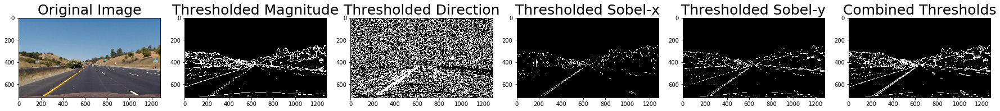

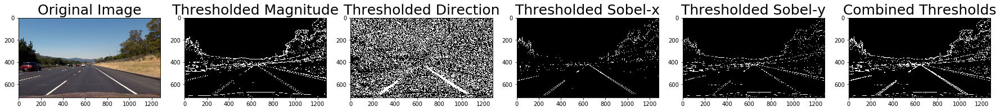

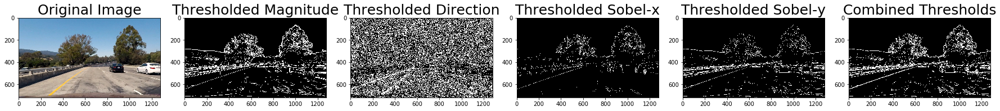

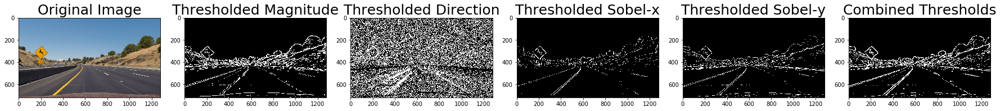

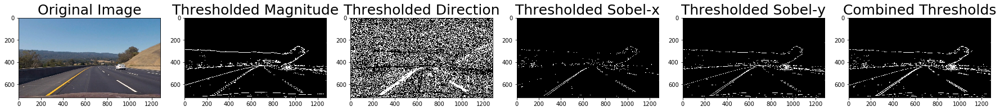

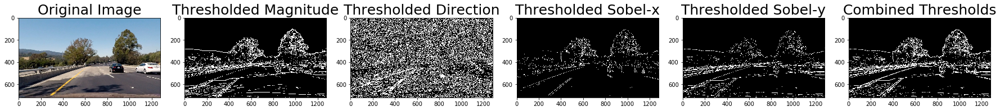

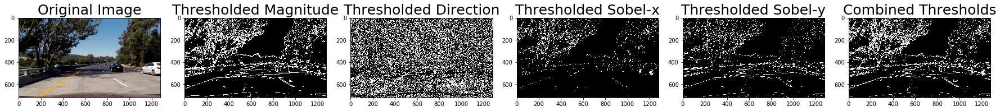

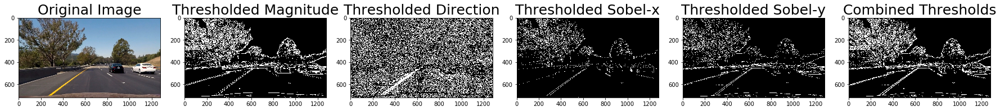

In [2]:
%matplotlib inline
def sobel(img, thresh_min=30, thresh_max=120, sobel_kernel=3):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    
    scale_factorx = np.max(abs_sobelx)/255 
    scale_factory = np.max(abs_sobely)/255 
    
    scaled_sobelx = (abs_sobelx/scale_factorx).astype(np.uint8) 
    scaled_sobely = (abs_sobely/scale_factory).astype(np.uint8) 

    sxbinary = np.zeros_like(scaled_sobelx)
    sxbinary[(scaled_sobelx >= thresh_min) & (scaled_sobelx <= thresh_max)] = 1
    
    
    sybinary = np.zeros_like(scaled_sobely)
    sybinary[(scaled_sobely >= thresh_min) & (scaled_sobely <= thresh_max)] = 1
    
    return sxbinary, sybinary

def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    
    # Create a binary image mask of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the gradient direction, 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # apply a threshold, and create a binary image result
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output


def combinedSpace(img):
    imgx, imgy = sobel(img, 30, 120, sobel_kernel=7)
    imgd = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    imgm = mag_threshold(img, sobel_kernel=9, mag_thresh=(30, 100))
    
    combined = np.zeros_like(imgx)
    combined[((imgx == 1) | (imgy == 1)) | ((imgm == 1) & (imgd == 1))] = 1
    #combined[((imgx == 1) | (imgy == 1)) ] = 1
    return combined


straight_images = glob.glob('./test_images/*.jpg')
for fname in straight_images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    cv2.imwrite('./output_images\\undistorted.jpg', img)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    imgx, imgy = sobel(img, 30, 120)
    imgd = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    imgm = mag_threshold(img, sobel_kernel=9, mag_thresh=(30, 100))
    
    
    combined = combinedSpace(img)
    cv2.imwrite("./output_images\combined_space.jpg", 255*combined)
    
    f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)
    
    ax2.imshow(imgm, cmap='gray')
    ax2.set_title('Thresholded Magnitude', fontsize=25)
    
    ax3.imshow(imgd, cmap='gray')
    ax3.set_title('Thresholded Direction', fontsize=25)
    
    ax4.imshow(imgx, cmap='gray')
    ax4.set_title('Thresholded Sobel-x', fontsize=25)
    
    ax5.imshow(imgy, cmap='gray')
    ax5.set_title('Thresholded Sobel-y', fontsize=25)
    
    ax6.imshow(combined, cmap='gray')
    ax6.set_title('Combined Thresholds', fontsize=25)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

## Colour threshold functions

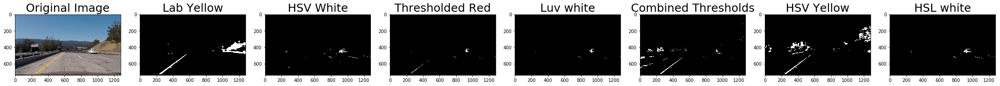

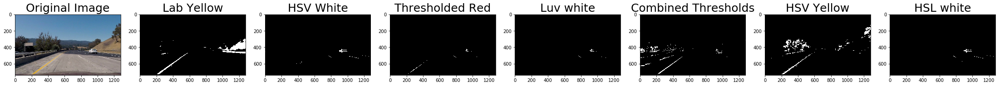

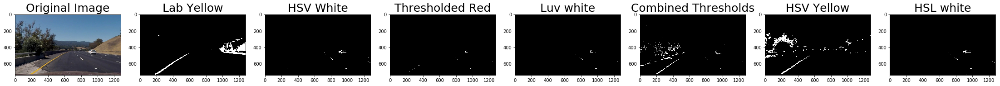

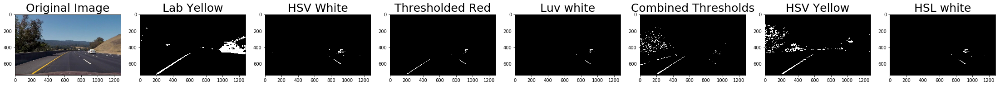

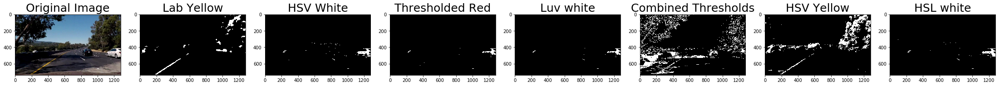

...

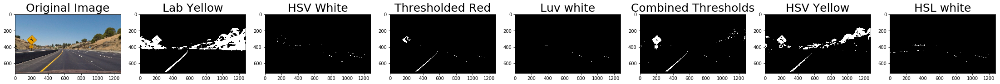

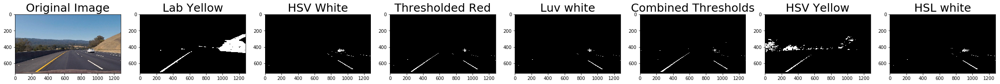

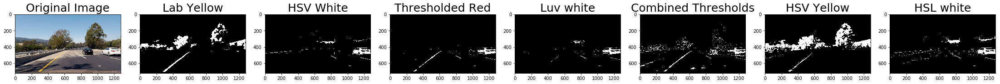

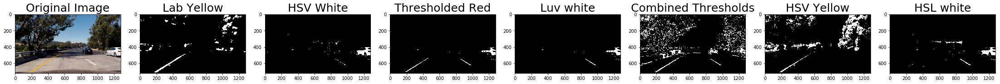

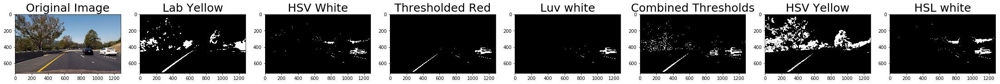

In [60]:
def hs_threshold(img, threshH=(50, 100), threshS=(145, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    #L = hls[:,:,1]
    S = hls[:,:,2]
    
    binaryH = np.zeros_like(S)
    binaryH[(S > threshH[0]) & (S <= threshH[1])] = 1
    
    binaryS = np.zeros_like(S)
    binaryS[(S > threshS[0]) & (S <= threshS[1])] = 1
    
    return binaryH, binaryS
                 
def r_threshold(img, thresh=(225, 255)):
    R = img[:,:,0]
    binary = np.zeros_like(R)
    binary[(R > thresh[0]) & (R <= thresh[1])] = 1
    return binary

def gray_threshold(img, thresh=(180, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

def hsv_threshold(img, lower, upper):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    binary = cv2.inRange(hsv, lower, upper)
    return binary


def hsv_yellow(img):
    lower = np.array([20,40,40])
    upper = np.array([50,255,255])    
    return hsv_threshold(img, lower, upper)

def hsv_white(img):
    sensitivity = 75
    lower = np.array([0,0,255-sensitivity])
    upper = np.array([255,20,255])
    return hsv_threshold(img, lower, upper)

def hsl_white(img):
    sensitivity = 65
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    white_1 = cv2.inRange(HSL, (0,255-sensitivity,0), (255,255,sensitivity))
    white_2 = cv2.inRange(img, (200,200,200), (255,255,255))
    
    return white_1 | white_2

def luv_white(img, lower=220, upper=255):
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    l = luv[:,:,0]
    binary = cv2.inRange(l, lower, upper)
    return binary

def lab_yellow(img, lower=145, upper=255):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    b = lab[:,:,2]
    binary = cv2.inRange(b, lower, upper)
    return binary

images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    imgh, imgs = hs_threshold(img)
    imgr = r_threshold(img)
    imgg = gray_threshold(img)
    imgw = hsl_white(img)
    imgy = hsv_yellow(img)
    imgyy = lab_yellow(img)
    imgww = luv_white(img)
    imgwww = hsv_white(img)
    
    combined = np.zeros_like(imgh)
    combined[ (imgs == 1) | ((imgr == 1) & (imgh == 0)) ] = 1
    
    cv2.imwrite("./output_images\combined_color.jpg", 255*combined)
    
    f, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = plt.subplots(1, 8, figsize=(30, 12))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)
    
    ax2.imshow(imgyy, cmap='gray')
    ax2.set_title('Lab Yellow', fontsize=25)
    
    ax3.imshow(imgwww, cmap='gray')
    ax3.set_title('HSV White', fontsize=25)
    
    ax4.imshow(imgr, cmap='gray')
    ax4.set_title('Thresholded Red', fontsize=25)
    
    ax5.imshow(imgww, cmap='gray')
    ax5.set_title('Luv white', fontsize=25)
    
    ax6.imshow(combined, cmap='gray')
    ax6.set_title('Combined Thresholds', fontsize=25)
    
    ax7.imshow(imgy, cmap='gray')
    ax7.set_title('HSV Yellow', fontsize=25)
    
    ax8.imshow(imgw, cmap='gray')
    ax8.set_title('HSL white', fontsize=25)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

## Combining space and colour

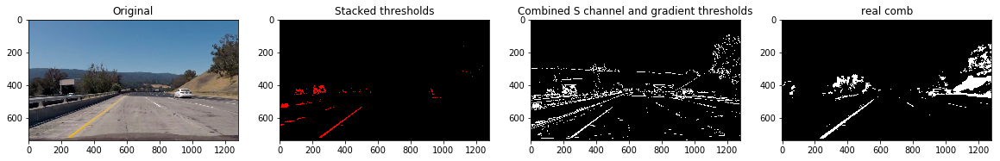

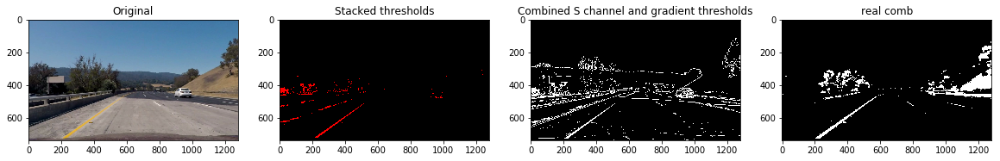

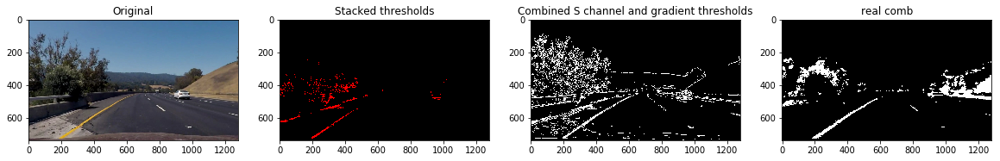

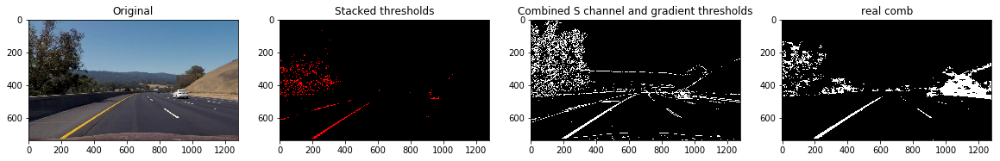

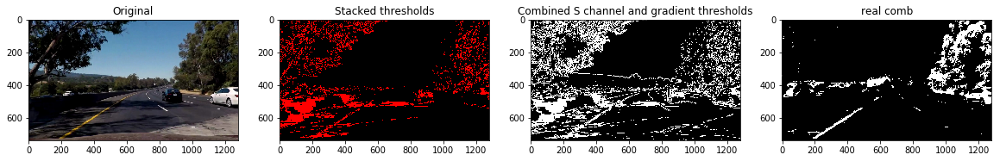

...

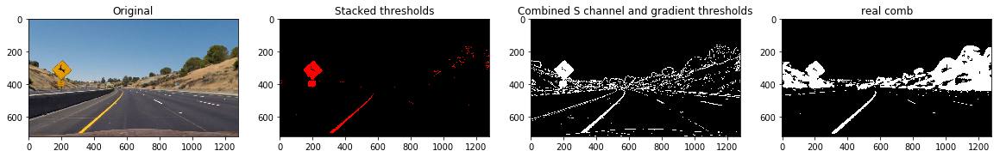

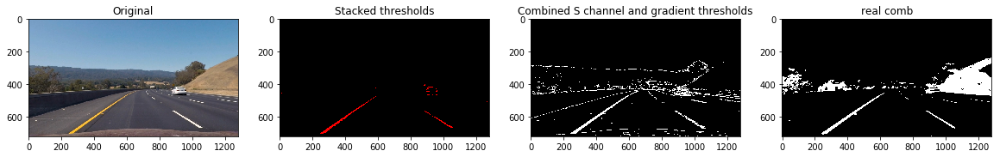

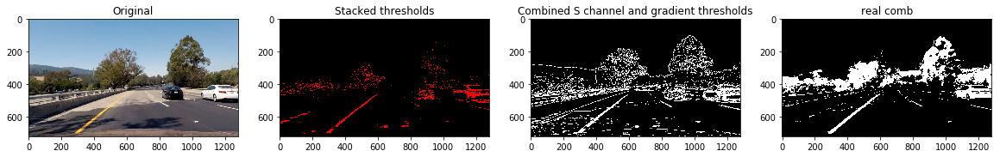

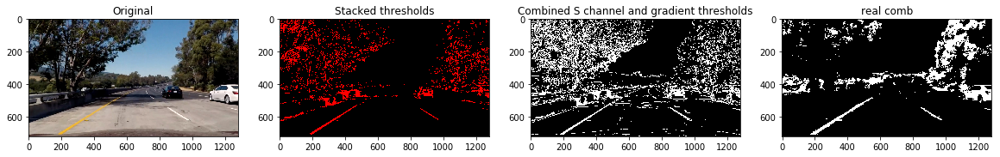

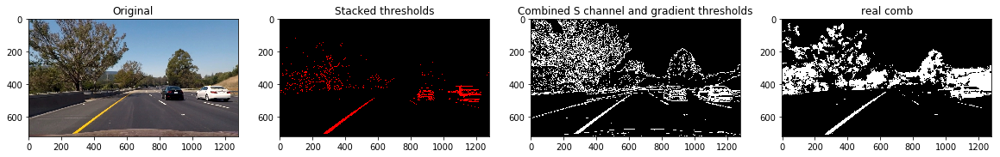

In [74]:
def combinedThreshold(img):
    #bh, bs = hs_threshold(img)
    #br = r_threshold(img)
    #cs = combinedSpace(img)
    y = hsv_yellow(img)
    yy = lab_yellow(img)
    
    w = hsl_white(img)
    ww = luv_white(img)
    www = hsv_white(img)
    
    combined = np.zeros_like(w)
    combined[ (w!=0) | (ww!=0) | (www!=0) | (y!=0) | (yy!=0)] = 1
    return combined

images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    imgr = r_threshold(img)
    imgh, imgs = hs_threshold(img)
    imgsx, imgsy = sobel(img)
    
    color_binary = 255*cv2.merge((imgs, np.zeros_like(imgsx), np.zeros_like(imgsx)))
    
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(imgs)
    combined_binary[(imgsx > 0) | (imgsy > 0) | (imgs > 0)] = 1
    
    combined = np.zeros_like(imgs)
    combined[ (imgs == 1) | (imgr == 1) | ((imgg == 1) & (imgh == 1))] = 1
    
    realcomb = combinedThreshold(img)
    cv2.imwrite("./output_images\combined_space_and_color.jpg", 255*realcomb)
    
    # Plotting thresholded images
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
    
    ax2.set_title('Stacked thresholds')
    ax2.imshow(color_binary)

    ax3.set_title('Combined S channel and gradient thresholds')
    ax3.imshow(combined_binary, cmap='gray')
    
    ax4.set_title('real comb')
    ax4.imshow(realcomb, cmap='gray')

## Perspective Transform of region of interest (ROI)

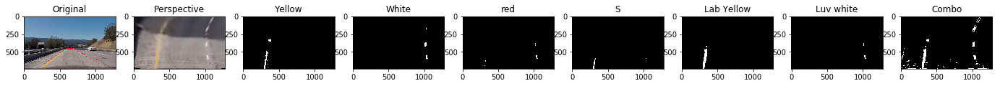

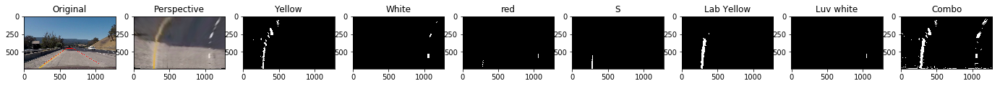

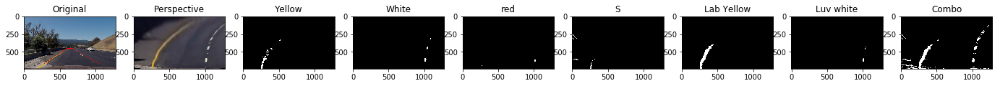

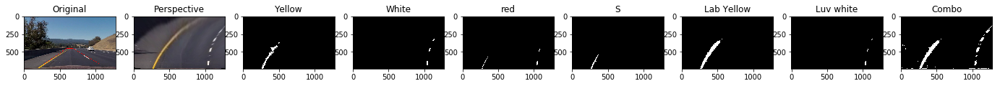

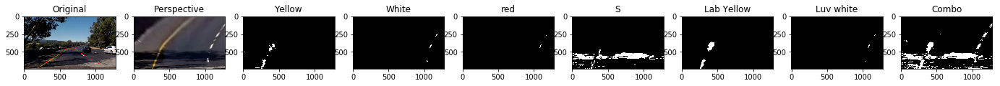

...

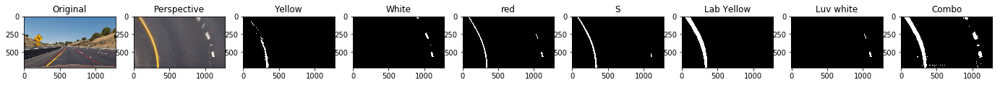

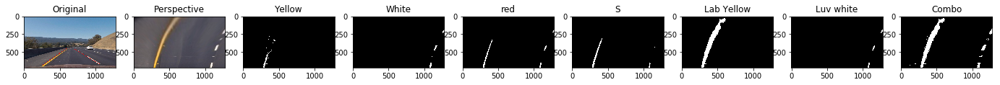

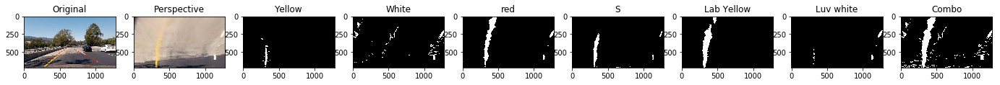

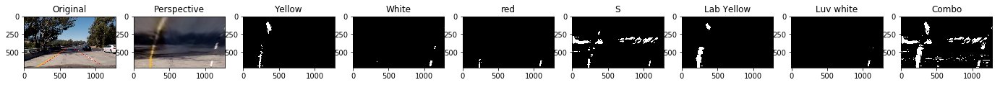

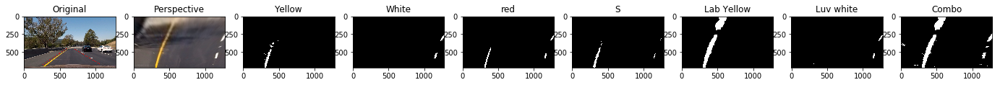

In [66]:
p1 = np.asarray([260, 680])
p2 = np.asarray([595,450])
p3 = np.asarray([685,450])
p4 = np.asarray([1060,671])

t1 = np.asarray([260, 720])
t2 = np.asarray([260, 0])
t3 = np.asarray([1075, 0])
t4 = np.asarray([1075,720])

src = np.float32([p1, p2, p3, p4])
lines = [(src[0], src[1]), (src[1], src[2]), (src[2], src[3])]
dst = np.float32([t1, t2, t3, t4])

def warp(img, src=src, dst=dst):
    M = cv2.getPerspectiveTransform(src, dst)
    shape = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, shape, flags=cv2.INTER_LINEAR)

    return warped

def unwarp(img):
    return warp(img, src=dst, dst=src)

images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img2 = warp(img)
    
    imgh, imgs = hs_threshold(img2)
    imgr = r_threshold(img2)
    imgg = gray_threshold(img2)
    imgw = hsl_white(img2)
    imgy = hsv_yellow(img2)
    imgyy = lab_yellow(img2)
    imgww = luv_white(img2)
    imgc = combinedThreshold(img2)
    
    cv2.imwrite("./output_images\warped_perspective.jpg", cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
    
    cv2.imwrite("./output_images\birds_eye_perspective.jpg", 255*img2)
    for line in lines:
        (x1,y1) = line[0]
        (x2,y2) = line[1]
        cv2.line(img, (x1, y1), (x2, y2), [255, 0, 0], 2)
    
    f, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9 ) = plt.subplots(1, 9, figsize=(24,24))
    ax1.set_title('Original')
    ax1.imshow(img)
    
    ax2.set_title('Perspective')
    ax2.imshow(img2)
    
    ax3.set_title('Yellow')
    ax3.imshow(imgy, cmap='gray')
    
    ax4.set_title('White')
    ax4.imshow(imgw, cmap='gray')
    
    ax5.set_title('red')
    ax5.imshow(imgr, cmap='gray')
    
    ax6.set_title('S')
    ax6.imshow(imgs, cmap='gray')
    
    ax7.set_title('Lab Yellow')
    ax7.imshow(imgyy, cmap='gray')
    
    ax8.set_title('Luv white')
    ax8.imshow(imgww, cmap='gray')
    
    ax9.set_title('Combo')
    ax9.imshow(imgc, cmap='gray')

## Threshold and Perspective Transforms

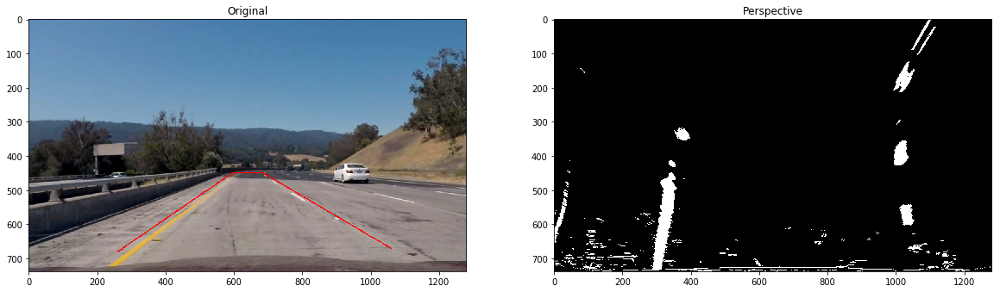

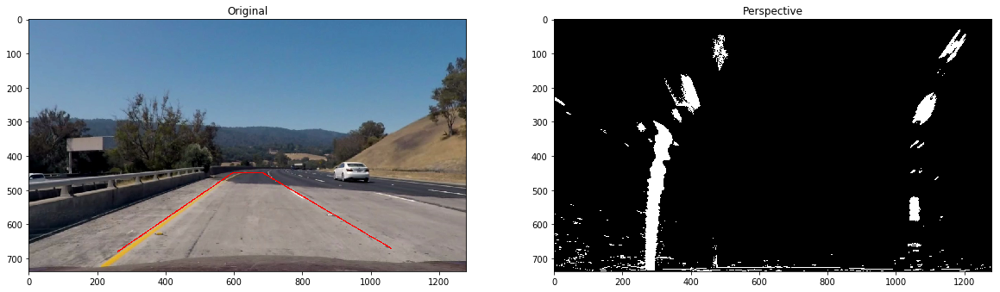

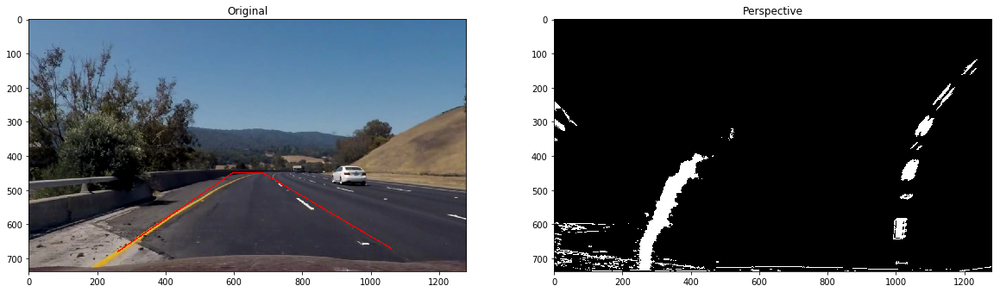

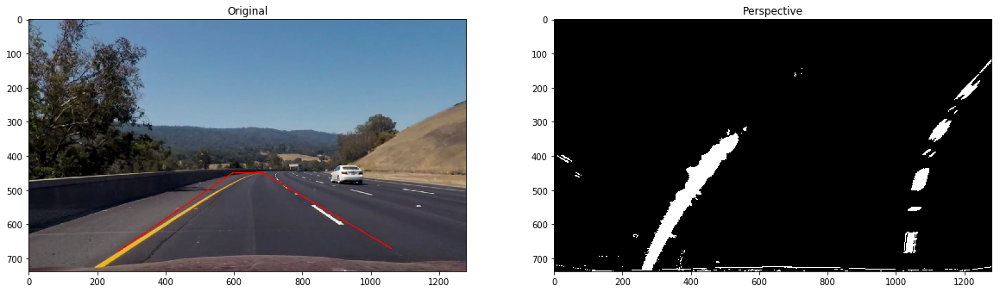

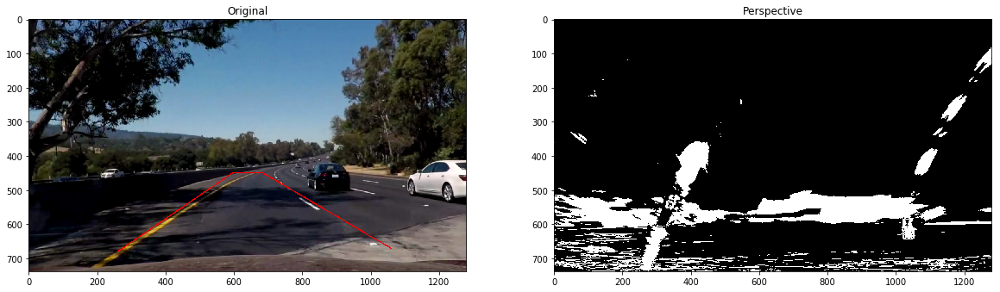

...

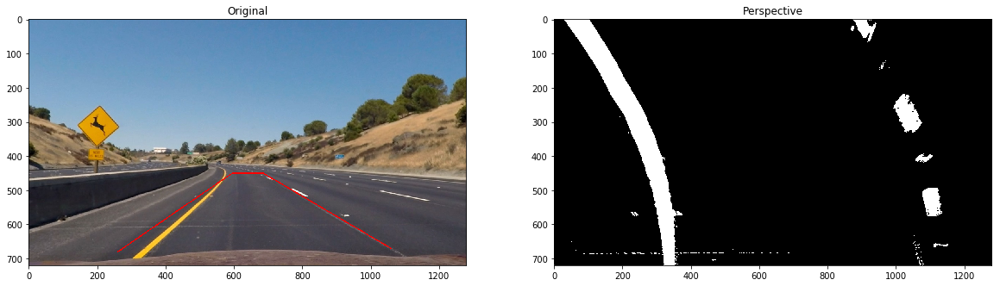

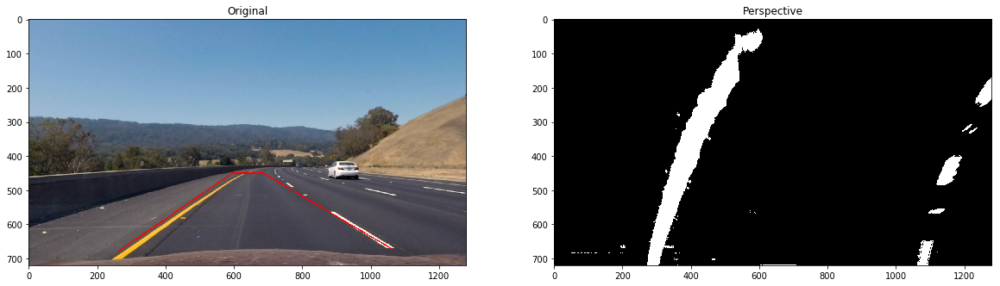

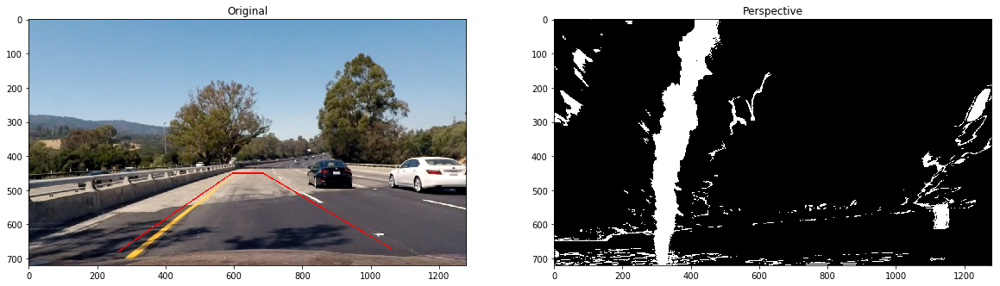

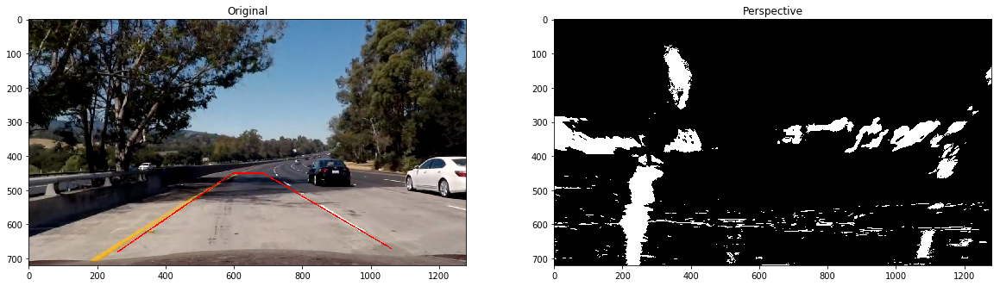

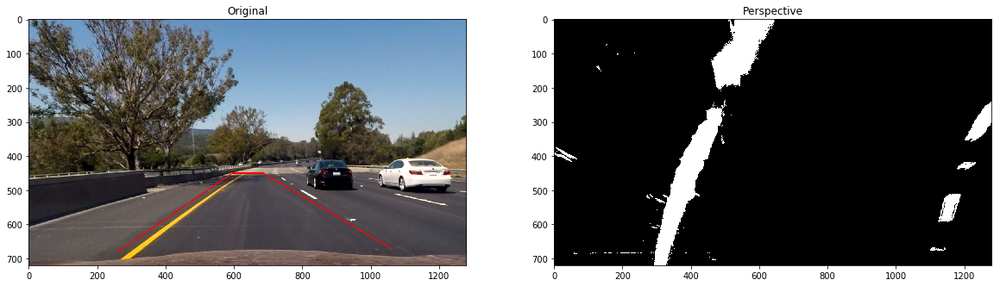

In [67]:
def perspectiveThreshold(img):
    wb = warp(img)
    return combinedThreshold(wb)

images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img2 = perspectiveThreshold(img)
    
    cv2.imwrite("./output_images\\birds_eye_perspective.jpg", 255*img2)
    for line in lines:
        (x1,y1) = line[0]
        (x2,y2) = line[1]
        cv2.line(img, (x1, y1), (x2, y2), [255, 0, 0], 2)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
    
    ax2.set_title('Perspective')
    ax2.imshow(img2, cmap='gray')

## Finding the Lane Lines

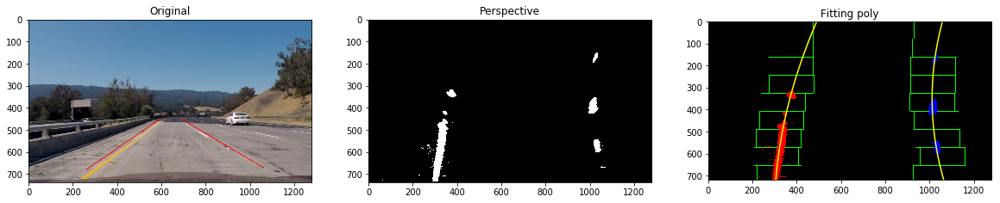

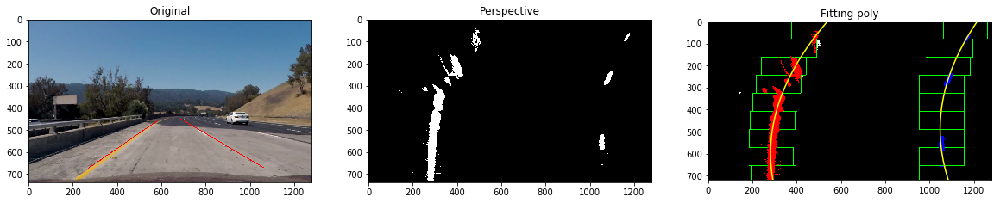

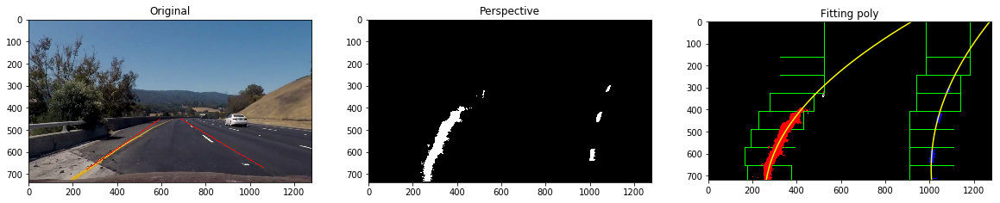

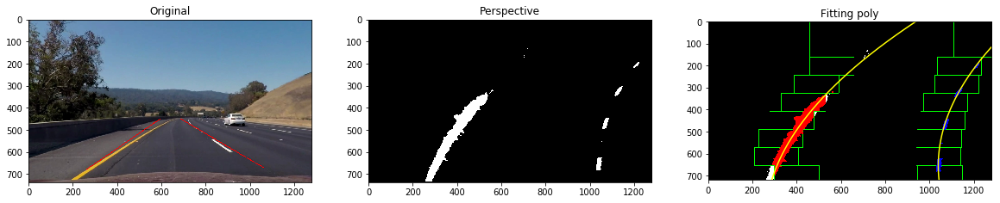

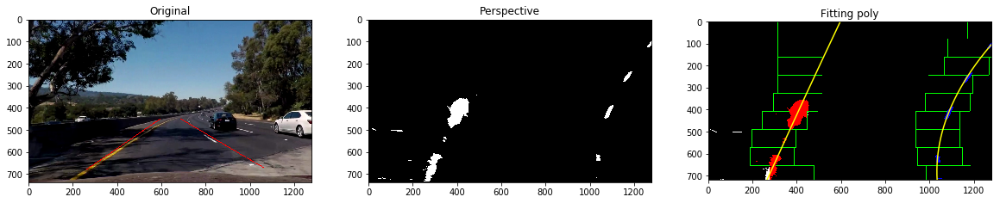

...

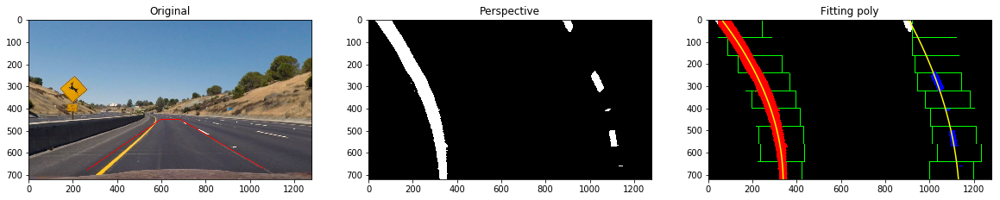

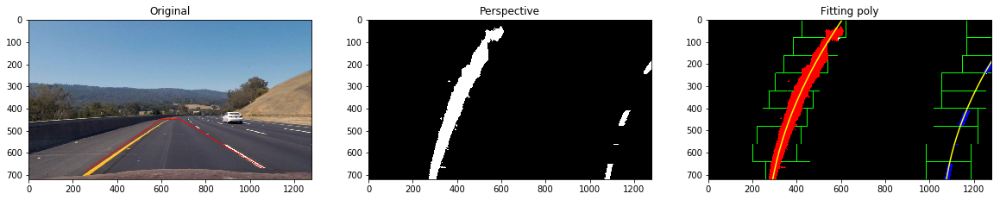

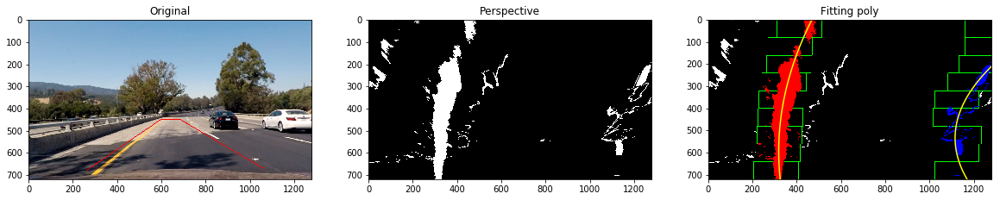

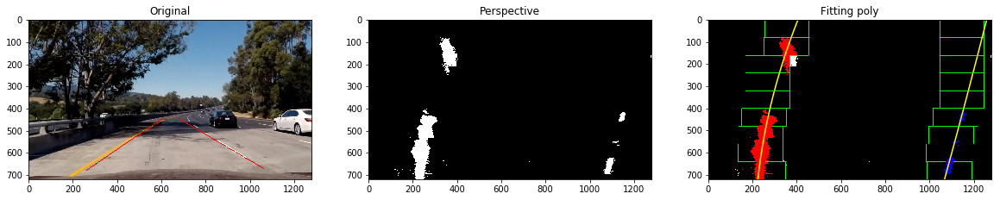

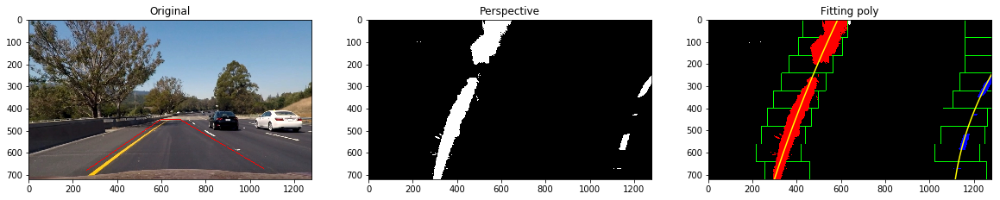

In [70]:

left_poly_old = [0,0,0]
right_poly_old = [0,0,0]

def avgPoly(a, b):
    alpha = 0.25
    c = [alpha*a[i]+(1-alpha)*b[i] for i in range(len(a))]
    return c

def findLanePolys(img, avg_old_data=False):
    histogram = np.sum(img[img.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
        
    if avg_old_data:
        global left_poly_old
        global right_poly_old
        next_left = left_fit
        next_right = right_fit
        left_fit = avgPoly(left_fit, left_poly_old)
        right_fit = avgPoly(right_fit, right_poly_old)
        left_poly_old = next_left
        right_poly_old = next_right
        
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fit = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit

images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    
    pt = perspectiveThreshold(img)
    
    for line in lines:
        (x1,y1) = line[0]
        (x2,y2) = line[1]
        cv2.line(img, (x1, y1), (x2, y2), [255, 0, 0], 2)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
    
    ax2.set_title('Perspective')
    ax2.imshow(pt, cmap='gray')
    
    img3, left_fitx, right_fitx, ploty, _, _ = findLanePolys(pt)
    cv2.imwrite("./output_images\poly_fit.jpg", img3)
    
    ax3.set_title("Fitting poly")
    plt.imshow(img3)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    
    

## Measuring Curvature and Displacement

In [12]:
def curvature(poly_fit, y_eval):
    # Define conversions y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    
    # Calculate the radius of curvature 
    curverad = ((1 + (2*poly_fit[0]*y_eval*ym_per_pix + poly_fit[1])**2)**1.5) / np.absolute(2*poly_fit[0])   
    return curverad

def eval_poly(poly, pt_y):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    pt_y = pt_y*ym_per_pix
    return poly[0]*pt_y**2 + poly[1]*pt_y + poly[2]
    
def dist_from_center(left_fit, right_fit, center, y_eval):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ym_per_pix = 30/720 # meters per pixel in y dimension
    lane_center = (eval_poly(left_fit, y_eval) + eval_poly(right_fit, y_eval)) / 2 
    
    return (center*xm_per_pix - lane_center)
    

## Transform Polynomial back to original image

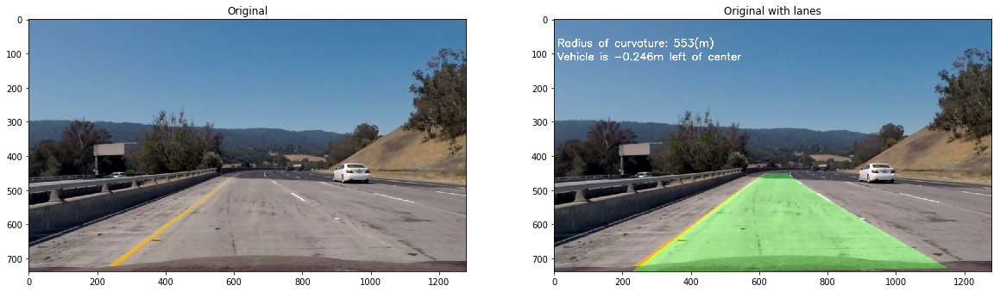

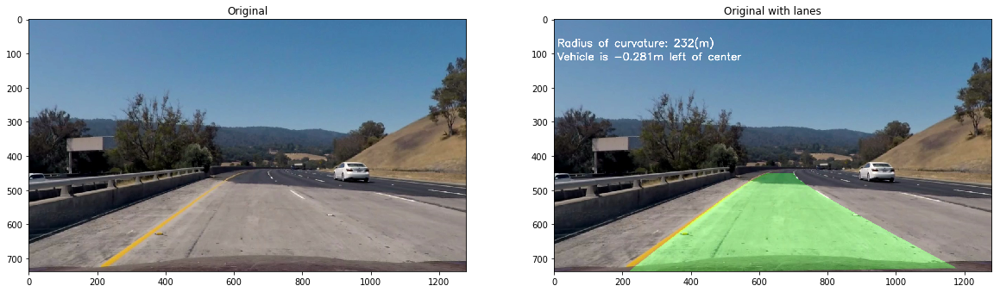

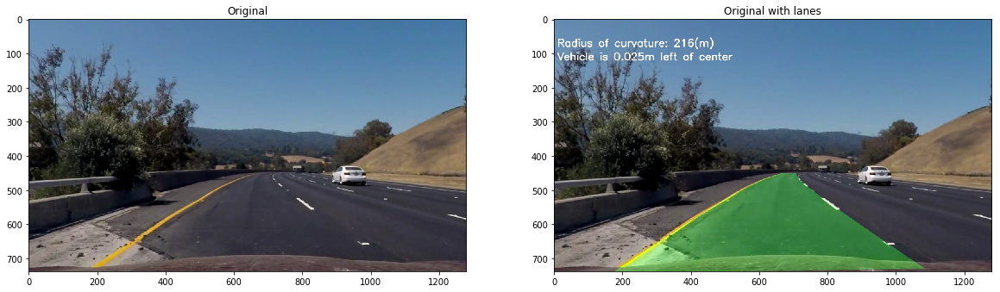

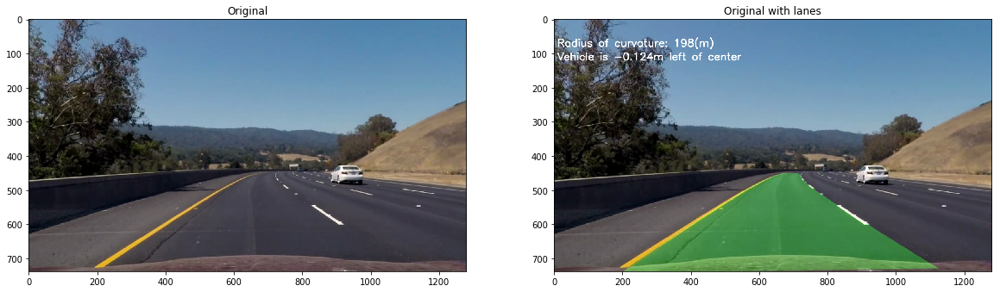

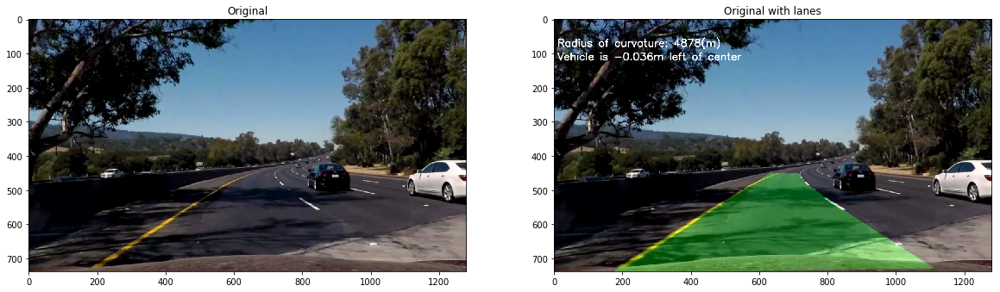

...

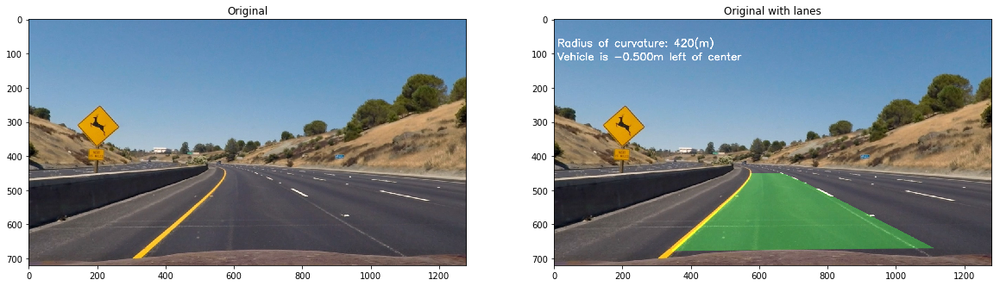

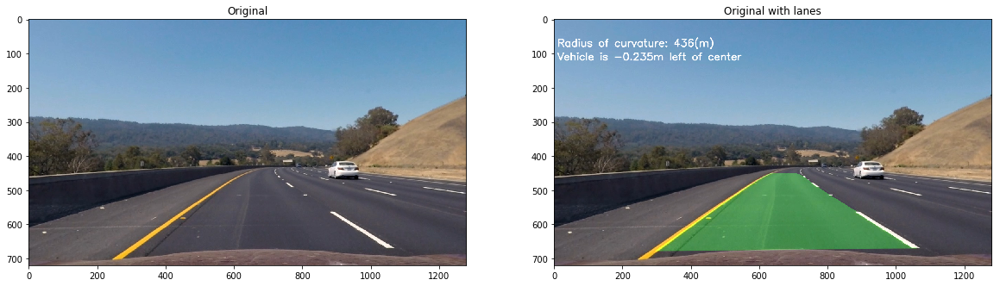

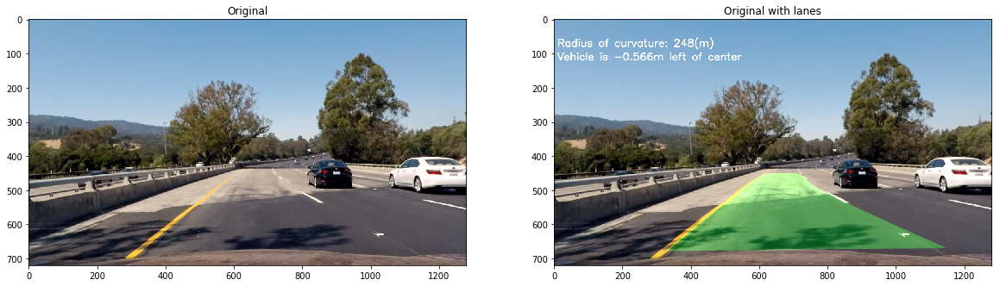

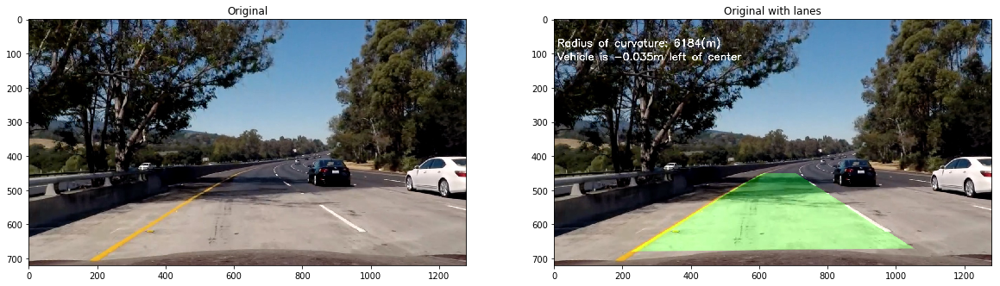

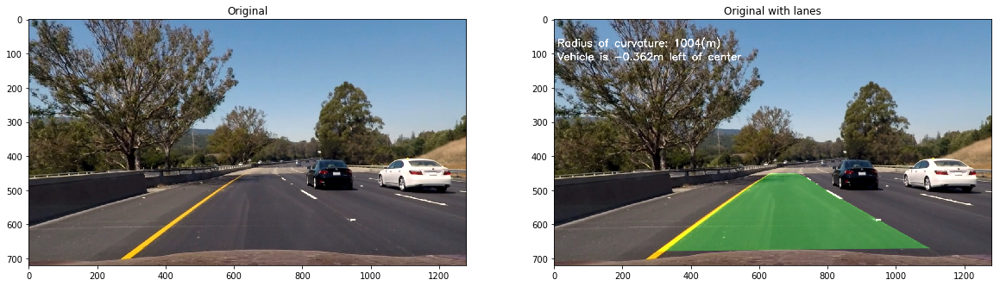

In [71]:
global polygon_points_old
polygon_points_old = None

def transformPolyOnImg(undist, avg_old_data=False):
    
    warped = perspectiveThreshold(undist)
    warped2, left_fitx, right_fitx, ploty, left_fit, right_fit = findLanePolys(warped, avg_old_data)
    
    yeval = undist.shape[0]-1
    curvature_left = curvature(left_fit, yeval)
    curvature_right = curvature(right_fit, yeval)
    left_of_center = dist_from_center(left_fit, right_fit, undist.shape[1]/2, yeval)
        
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = unwarp(color_warp)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    #cv2.putText(result,'Left radius of curvature: {:.0f}'.format(curvature_left), (10,40), font, 1,(255,255,255),2,cv2.LINE_AA)
    #cv2.putText(result,'Right radius of curvature: {:.0f}'.format(curvature_right), (10,80), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Radius of curvature: {:.0f}(m)'.format((curvature_right+curvature_left)/2), (10,80), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Vehicle is {:.3f}m left of center'.format(left_of_center), (10,120), font, 1,(255,255,255),2,cv2.LINE_AA)
    return result
    
images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    img,_,_ = undistort_image(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
        
    img2 = transformPolyOnImg(img)
    cv2.imwrite("./output_images\lane_lines_and_curvature.jpg", cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
    
    ax2.set_title('Original with lanes')
    ax2.imshow(img2)
    

## Apply to video file 

In [72]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(img):
    undist,_,_ = undistort_image(img)
    return transformPolyOnImg(undist, True)


In [75]:
output_video = 'output_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")
output_clip = clip1.fl_image(process_image)
%time output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4



100%|█████████▉| 1260/1261 [14:33<00:00,  1.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

Wall time: 14min 34s


## Video of the road

In [2]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("./project_video.mp4"))

## Image pileline applied to the above video to find the lane lines

In [47]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("./output_video.mp4"))

## Challenge 1

In [12]:
output_video = 'challenge_out_video.mp4'
clip1 = VideoFileClip("./challenge_video.mp4")
output_clip = clip1.fl_image(process_image)
%time output_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video challenge_out_video.mp4
[MoviePy] Writing video challenge_out_video.mp4


100%|██████████| 485/485 [06:30<00:00,  1.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_out_video.mp4 

Wall time: 6min 31s


In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("./challenge_out_video.mp4"))